## **Aplicação PoseNet**

In [1]:
import sys
sys.path.append('../../')

In [2]:
import matplotlib.pyplot as plt
import os
import cv2 as cv
import numpy as np
import json
from pathlib import Path
import pandas as pd
from typing import Dict, List, Tuple, Callable

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms as T
from torch.utils.data import DataLoader
from tqdm import tqdm
import torch.optim as optim
import optuna
import kornia
import seaborn as sns
from scipy.stats import pearsonr

# Importar sua classe existente
from notebooks.playground_VC.posenet.posenet import PoseNet
from src.vfss_dataset import VFSSImageDataset
from src.utils import get_script_relative_path, get_project_root_directory
from src.data_extraction.video_frame import create_video_frame_df, load_video_frame_metadata_from_csv
from src.split_data import split_data_k_fold
from src.utils import get_corners_from_angle
from src.target.heatmap import generate_heatmap_from_points
from src.utils import plot_image_with_mask

In [3]:
# UTILS
# =======================================

def clahe(img):
    img_clahe = kornia.enhance.equalize_clahe(img, clip_limit = 5.0)#, clip_limit=20.0, grid_size=(8, 8))
    return img_clahe

def modify_input(img):
    # Padroniza tudo para o formato (batch, filtro, H, W)
    if (len(img.shape) != 4):
        img = img.unsqueeze(0) 
    
    # Modifica cada uma das imagens
    list_imgs = []
    n_batch = img.shape[0]
    for i in range(n_batch):
        img_orig = img[i][0] # (filtro, H, W)

        # Aplica CLAHE
        img_clahe = clahe(img_orig)

        # Aplica Double CLAHE
        img_double_clahe = clahe(img_clahe)

        # Stack Channels
        img_channels = torch.stack([img_orig, img_clahe, img_double_clahe])

        # Stack Batch
        list_imgs.append(img_channels)

    img_new = torch.stack(list_imgs, dim = 0)
    
    return img_new

def custom_collate_fn(batch):
    """
    batch é uma lista de tuplas: [(frame, target_dict, meta), (frame, target_dict, meta), ...]
    """
    frames = torch.stack([item[0] for item in batch])  # Empilha os inputs (frames)
    
    # Agrupa os targets por chave
    target_dicts = [item[1] for item in batch]

    batched_targets = {}
    for key in target_dicts[0].keys():
        list_aux = []
        for td in target_dicts:
            list_aux.append(td[key])
        batched_targets[key] = torch.stack(list_aux)

    # Mantém os metadados como lista
    metas = [item[2] for item in batch]

    return frames, batched_targets, metas

In [4]:
# CONFIGURAÇÕES DE TREINAMENTO
# =======================================

class TrainingConfig:
    """Centraliza configurações de treinamento"""
    def __init__(
        self,
        learning_rate: float = 3e-4,
        batch_size: int = 8,
        epochs: int = 200,
        patience: int = 5,
        checkpoint_dir: str = "./checkpoints/posenet",
        device: str = "cuda"
    ):
        self.learning_rate = learning_rate
        self.batch_size = batch_size
        self.epochs = epochs
        self.patience = patience
        self.checkpoint_dir = Path(checkpoint_dir)
        self.checkpoint_dir.mkdir(parents=True, exist_ok=True)
        self.device = device

In [5]:
# GERENCIADOR DE CHECKPOINT
# =======================================

class CheckpointManager:
    """Gerencia salvamento e carregamento de checkpoints"""
    def __init__(self, checkpoint_dir: Path, fold: int):
        self.checkpoint_dir = checkpoint_dir
        self.fold = fold
        self.best_loss = float('inf')
        
    def save_checkpoint(
        self, 
        model: nn.Module, 
        optimizer: optim.Optimizer,
        epoch: int,
        val_loss: float,
        train_loss: float,
        is_best: bool = False
    ):
        """Salva checkpoint do modelo"""
        checkpoint = {
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_loss': val_loss,
            'train_loss': train_loss,
            'fold': self.fold
        }
        
        # Salva checkpoint da última época
        last_path = self.checkpoint_dir / f"fold_{self.fold}_last.pth"
        torch.save(checkpoint, last_path)
        
        # Salva melhor modelo
        if is_best:
            best_path = self.checkpoint_dir / f"fold_{self.fold}_best.pth"
            torch.save(checkpoint, best_path)
            self.best_loss = val_loss
            print(f"✓ Melhor modelo salvo (val_loss: {val_loss:.4f})")
    
    def load_checkpoint(self, model: nn.Module, optimizer: optim.Optimizer, best: bool = True):
        """Carrega checkpoint"""
        suffix = "best" if best else "last"
        checkpoint_path = self.checkpoint_dir / f"fold_{self.fold}_{suffix}.pth"
        
        if not checkpoint_path.exists():
            print(f"Checkpoint não encontrado: {checkpoint_path}")
            return None
        
        checkpoint = torch.load(checkpoint_path)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        
        print(f"✓ Checkpoint carregado: epoch {checkpoint['epoch']}, val_loss: {checkpoint['val_loss']:.4f}")
        return checkpoint


In [6]:
# CALCULADOR DA LOSS
# =======================================

class LossCalculator:
    """Centraliza o cálculo de perdas"""
    def __init__(self, criterion_heatmap, config: TrainingConfig):
        self.criterion_heatmap = criterion_heatmap
        self.config = config
    
    def calculate_loss(self, pred_heatmap, gt_heatmap):
        """Calcula perda combinada"""
        loss_heatmap = self.criterion_heatmap(pred_heatmap, gt_heatmap)
        
        loss_total = (
            loss_heatmap
        )
        
        return loss_total, {
            'heatmap': loss_heatmap.item(),
        }


In [7]:
# TREINA UMA EPOCA
# =======================================

def train_one_epoch(
    model: nn.Module,
    train_loader: DataLoader,
    loss_calculator: LossCalculator,
    optimizer: optim.Optimizer,
    device: str,
    modify_input_fn: Callable,
    accumulation_steps: int = 4  # Novo parâmetro
) -> Tuple[float, Dict]:
    """Treina uma época com gradient accumulation"""
    model.train()
    running_loss = 0.0
    loss_components = {'heatmap': 0.0}
    
    for batch_idx, (inputs, targets, _) in enumerate(tqdm(train_loader, desc="Treinando")):
        inputs = modify_input_fn(inputs).to(device)
        gt_heatmap = targets['heatmap'].to(device)
        
        pred_heatmap = model(inputs)
        
        loss_total, components = loss_calculator.calculate_loss(
           pred_heatmap, gt_heatmap
        )
        
        # Normaliza a loss pelo número de acumulações
        loss_total = loss_total / accumulation_steps
        loss_total.backward()
        
        optimizer.step()
        
        running_loss += loss_total.item() * accumulation_steps
        for key in loss_components:
            loss_components[key] += components[key]

        # Libera memória explicitamente
        del inputs, gt_heatmap, pred_heatmap, loss_total
        torch.cuda.empty_cache()  # Use com moderação!
    
    n_batches = len(train_loader)
    avg_loss = running_loss / n_batches
    avg_components = {k: v / n_batches for k, v in loss_components.items()}
    
    return avg_loss, avg_components

In [8]:
# VALIDAÇÃO
# =======================================

def validate(
    model: nn.Module,
    val_loader: DataLoader,
    loss_calculator: LossCalculator,
    device: str,
    modify_input_fn: Callable
) -> Tuple[float, Dict]:
    """Valida o modelo"""
    model.eval()
    val_loss = 0.0
    loss_components = {'heatmap': 0.0}
    
    with torch.no_grad():
        for inputs, targets, _ in val_loader:
            inputs = modify_input_fn(inputs).to(device)
            gt_heatmap = targets['heatmap'].to(device)
            
            pred_heatmap = model(inputs)
            
            loss_total, components = loss_calculator.calculate_loss(
                pred_heatmap, gt_heatmap
            )
            
            val_loss += loss_total.item()
            for key in loss_components:
                loss_components[key] += components[key]
    
    n_batches = len(val_loader)
    avg_loss = val_loss / n_batches
    avg_components = {k: v / n_batches for k, v in loss_components.items()}
    
    return avg_loss, avg_components


In [9]:
# TREINA UM FOLD
# ======================================= 

def train_one_fold(
    model: nn.Module,
    train_loader: DataLoader,
    val_loader: DataLoader,
    config: TrainingConfig,
    fold: int,
    modify_input_fn: Callable
) -> Tuple[nn.Module, List[Dict]]:
    """Treina um fold completo com early stopping e checkpoints"""
    
    model.to(config.device)
    
    # Configuração
    criterion_heatmap = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=config.learning_rate)
    
    loss_calculator = LossCalculator(criterion_heatmap, config)
    checkpoint_manager = CheckpointManager(config.checkpoint_dir, fold)
    
    # Tracking
    best_val_loss = float('inf')
    patience_counter = 0
    history = []
    
    for epoch in range(config.epochs):
        # Treino
        train_loss, train_components = train_one_epoch(
            model, train_loader, loss_calculator, optimizer, config.device, modify_input_fn
        )
        
        # Validação
        val_loss, val_components = validate(
            model, val_loader, loss_calculator, config.device, modify_input_fn
        )
        
        # Logging
        epoch_info = {
            'epoch': epoch + 1,
            'train_loss': train_loss,
            'val_loss': val_loss,
            'train_components': train_components,
            'val_components': val_components
        }
        history.append(epoch_info)
        
        print(f"Época {epoch+1}/{config.epochs}")
        print(f"  Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")
        print(f"  Heatmap: {val_components['heatmap']:.4f}, ")
        
        # Checkpoint e Early Stopping
        is_best = val_loss < best_val_loss
        checkpoint_manager.save_checkpoint(
            model, optimizer, epoch, val_loss, train_loss, is_best
        )
        
        if is_best:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= config.patience:
                print(f"Early stopping ativado na época {epoch+1}")
                break
    
    # Carrega melhor modelo
    checkpoint_manager.load_checkpoint(model, optimizer, best=True)
    
    return model, history

In [10]:
# VALIDAÇÃO CRUZADA
# ======================================= 

def cross_validate(
    model_class,
    folds: List[pd.DataFrame],
    config: TrainingConfig,
    target: str,
    output_dim: Tuple[int, int],
    modify_input_fn: Callable,
    dataset_class,
    collate_fn: Callable,
    model_kwargs: Dict = None
) -> Dict:
    """Executa validação cruzada K-Fold"""
    
    model_kwargs = model_kwargs or {}
    k = len(folds)
    results = {
        'fold_losses': [],
        'fold_histories': [],
        'best_fold': None,
        'best_loss': float('inf')
    }
    
    for i in range(k):
        print(f"\n{'='*50}")
        print(f"FOLD {i+1}/{k}")
        print(f"{'='*50}")
        
        # Preparação dos dados
        df_val = folds[i]
        df_train = pd.concat([folds[j] for j in range(k) if j != i], ignore_index=True)
        
        train_set = dataset_class(df_train, target, output_dim)
        val_set = dataset_class(df_val, target, output_dim)
        
        train_loader = DataLoader(
            train_set, batch_size=config.batch_size, shuffle=True, collate_fn=collate_fn
        )
        val_loader = DataLoader(
            val_set, batch_size=config.batch_size, shuffle=False, collate_fn=collate_fn
        )
        
        # Novo modelo para cada fold
        model = model_class(**model_kwargs)
        
        # Treina fold
        model, history = train_one_fold(
            model, train_loader, val_loader, config, i+1, modify_input_fn
        )
        
        # Validação final
        final_val_loss, _ = validate(
            model, val_loader, 
            LossCalculator(nn.MSELoss(), config),
            config.device, modify_input_fn
        )
        
        results['fold_losses'].append(final_val_loss)
        results['fold_histories'].append(history)
        
        # Atualiza melhor fold
        if final_val_loss < results['best_loss']:
            results['best_loss'] = final_val_loss
            results['best_fold'] = i + 1
        
        print(f"\nFold {i+1} Loss Final: {final_val_loss:.4f}")
    
    # Estatísticas finais
    results['mean_loss'] = np.mean(results['fold_losses'])
    results['std_loss'] = np.std(results['fold_losses'])
    
    print(f"\n{'='*50}")
    print(f"RESULTADOS FINAIS")
    print(f"{'='*50}")
    print(f"Média dos Folds: {results['mean_loss']:.4f} ± {results['std_loss']:.4f}")
    print(f"Melhor Fold: {results['best_fold']} (Loss: {results['best_loss']:.4f})")
    
    # Salva resultados
    results_path = config.checkpoint_dir / "cross_validation_results.json"
    with open(results_path, 'w') as f:
        json.dump({
            'fold_losses': results['fold_losses'],
            'mean_loss': results['mean_loss'],
            'std_loss': results['std_loss'],
            'best_fold': results['best_fold'],
            'best_loss': results['best_loss']
        }, f, indent=2)
    
    return results

In [11]:
# TUNAGEM DE HIPERPARÂMETROS
# ======================================= 

def objective_optuna(
    trial: optuna.Trial,
    model_class,
    folds: List[pd.DataFrame],
    target: str,
    output_dim: Tuple[int, int],
    modify_input_fn: Callable,
    dataset_class,
    collate_fn: Callable,
    device: str,
    epochs: int,
    model_kwargs: Dict = None
) -> float:
    """Função objetivo para otimização Optuna"""
    
    # Hiperparâmetros a serem otimizados
    lr = trial.suggest_float("lr", 1e-5, 1e-2, log=True)
    batch_size = trial.suggest_categorical("batch_size", [4, 8, 16, 32])
    
    # Configuração com hiperparâmetros sugeridos
    config = TrainingConfig(
        learning_rate=lr,
        batch_size=batch_size,
        epochs=epochs,  # Reduzido para Optuna
        patience=10,
        checkpoint_dir=f"./optuna_trials/trial_{trial.number}",
        device=device
    )
    
    # Executa cross-validation
    results = cross_validate(
        model_class, folds, config, target, output_dim,
        modify_input_fn, dataset_class, collate_fn, model_kwargs
    )

    # Limpa memória após cada trial
    torch.cuda.empty_cache()
    
    # Pruning - reporta loss intermediária para parar trials ruins
    # Optuna pode cancelar trials que claramente não vão dar certo
    trial.report(results['mean_loss'], step=0)
    if trial.should_prune():
        raise optuna.TrialPruned()
    
    return results['mean_loss']


def tune_hyperparameters(
    model_class,
    folds: List[pd.DataFrame],
    target: str,
    output_dim: Tuple[int, int],
    modify_input_fn: Callable,
    dataset_class,
    collate_fn: Callable,
    device: str,
    epochs: int = 50,
    n_trials: int = 20,
    model_kwargs: Dict = None
) -> optuna.Study:
    """Tunagem de hiperparâmetros com Optuna"""
    
    study = optuna.create_study(
        direction="minimize",
        study_name="posenet_hyperparameter_tuning"
    )
    
    study.optimize(
        lambda trial: objective_optuna(
            trial, model_class, folds, target, output_dim,
            modify_input_fn, dataset_class, collate_fn, device, epochs, model_kwargs
        ),
        n_trials=n_trials,
        show_progress_bar=True
    )
    
    print("\n" + "="*50)
    print("MELHORES HIPERPARÂMETROS")
    print("="*50)
    print(f"Melhor Loss: {study.best_value:.4f}")
    print("Parâmetros:")
    for key, value in study.best_params.items():
        print(f"  {key}: {value}")
    
    return study

In [12]:
# VISUALIZAÇÃO E ANÁLISE DE RESULTADOS
# ======================================= 

class TestEvaluator:
    """Avalia modelo no conjunto de teste e gera visualizações"""
    
    def __init__(
        self,
        model_class,
        model_kwargs: Dict,
        checkpoint_path: str,
        device: str,
        modify_input_fn: Callable
    ):
        self.model_class = model_class
        self.model_kwargs = model_kwargs or {}
        self.device = device
        self.modify_input_fn = modify_input_fn
        
        # Carrega modelo
        self.model = model_class(**self.model_kwargs).to(device)
        checkpoint = torch.load(checkpoint_path, map_location=device)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.model.eval()
        
        print(f"✓ Modelo carregado: {checkpoint_path}")
        print(f"  Epoch: {checkpoint.get('epoch', 'N/A')}")
        print(f"  Val Loss: {checkpoint.get('val_loss', 'N/A'):.4f}")
    
    def extract_keypoints_from_heatmap(self, heatmap: torch.Tensor) -> torch.Tensor:
        """Extrai coordenadas dos keypoints do heatmap"""
        num_keypoints = heatmap.shape[0]
        points = torch.zeros(num_keypoints, 2)
        
        for k in range(num_keypoints):
            heatmap_k = heatmap[k].cpu().numpy()
            idx = np.unravel_index(np.argmax(heatmap_k), heatmap_k.shape)
            points[k] = torch.tensor([idx[0], idx[1]])  # (y, x)
        
        return points
    
    def euclidean_distance(self, point1: torch.Tensor, point2: torch.Tensor) -> float:
        """Calcula distância euclidiana entre dois pontos"""
        return torch.sqrt(torch.sum((point1 - point2) ** 2)).item()
    
    def evaluate_test_set(
        self,
        test_dataset,
        loss_calculator: LossCalculator
    ) -> Dict:
        """Avalia modelo no conjunto de teste"""
        
        num_keypoints = self.model_kwargs['num_keypoints']
        
        results = {
            'keypoint_distances': [[] for _ in range(num_keypoints)],
            'total_losses': [],
            'predictions': [],
            'ground_truths': [],
            'images': []
        }
        
        print(f"\nAvaliando {len(test_dataset)} amostras do conjunto de teste...")
        
        for idx in tqdm(range(len(test_dataset)), desc="Avaliando"):
            input_img, target, _ = test_dataset[idx]
            
            # Preparação
            input_tensor = self.modify_input_fn(input_img).float().to(self.device)
            gt_heatmap = target['heatmap'].float().to(self.device)
            
            # Inferência
            with torch.no_grad():
                pred_heatmap = self.model(input_tensor)
            
            pred_heatmap = pred_heatmap.squeeze(0)
            
            # Extrai pontos
            gt_points = self.extract_keypoints_from_heatmap(gt_heatmap)
            pred_points = self.extract_keypoints_from_heatmap(pred_heatmap)
            
            # Calcula distâncias por keypoint
            for k in range(num_keypoints):
                dist = self.euclidean_distance(gt_points[k], pred_points[k])
                results['keypoint_distances'][k].append(dist)
            
            # Calcula losses
            loss_total, components = loss_calculator.calculate_loss(
                pred_heatmap, gt_heatmap
            )
            
            results['total_losses'].append(loss_total.item())
            
            # Armazena para visualização
            results['predictions'].append({
                'points': pred_points,
                'heatmap': pred_heatmap.cpu(),
            })
            results['ground_truths'].append({
                'points': gt_points,
                'heatmap': gt_heatmap.cpu(),
            })
            results['images'].append(input_tensor.squeeze(0).cpu())
        
        # Converte para arrays
        for k in range(num_keypoints):
            results['keypoint_distances'][k] = np.array(results['keypoint_distances'][k])
        results['total_losses'] = np.array(results['total_losses'])
        
        return results
    
    def plot_loss_distributions(
        self,
        results: Dict,
        save_path: str = None
    ):
        """Plota histogramas das distribuições de loss"""
        
        fig, ax = plt.subplots(1, 1, figsize=(14, 10))
        fig.suptitle('Distribuição das Losses no Conjunto de Teste', fontsize=16, y=1.0)
        
        # 1. Total Loss
        ax.hist(results['total_losses'], bins=30, color='lightcoral', edgecolor='black', alpha=0.7)
        ax.axvline(np.mean(results['total_losses']), color='red', linestyle='--',
                   label=f'Média: {np.mean(results["total_losses"]):.4f}')
        ax.axvline(np.median(results['total_losses']), color='green', linestyle='--',
                   label=f'Mediana: {np.median(results["total_losses"]):.4f}')
        ax.set_xlabel('Total Loss')
        ax.set_ylabel('Frequência')
        ax.set_title('Distribuição: Total Loss')
        ax.legend()
        ax.grid(alpha=0.3)
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"✓ Gráfico salvo: {save_path}")
        
        plt.show()
    
    def plot_keypoint_analysis(
        self,
        results: Dict,
        save_path: str = None
    ):
        """Plota análise detalhada por keypoint"""
        
        num_keypoints = len(results['keypoint_distances'])
        fig, axes = plt.subplots(1, num_keypoints, figsize=(6*num_keypoints, 5))
        
        if num_keypoints == 1:
            axes = [axes]
        
        fig.suptitle('Análise de Distâncias por Keypoint', fontsize=16)
        
        for k in range(num_keypoints):
            ax = axes[k]
            distances = results['keypoint_distances'][k]
            
            # Histograma
            ax.hist(distances, bins=30, color='orange', edgecolor='black', alpha=0.7)
            
            # Estatísticas
            mean_dist = np.mean(distances)
            median_dist = np.median(distances)
            std_dist = np.std(distances)
            
            ax.axvline(mean_dist, color='red', linestyle='--', linewidth=2,
                      label=f'Média: {mean_dist:.2f}px')
            ax.axvline(median_dist, color='green', linestyle='--', linewidth=2,
                      label=f'Mediana: {median_dist:.2f}px')
            
            ax.set_xlabel('Distância Euclidiana (pixels)')
            ax.set_ylabel('Frequência')
            ax.set_title(f'Keypoint {k+1}\n(Std: {std_dist:.2f}px)')
            ax.legend()
            ax.grid(alpha=0.3)
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"✓ Gráfico salvo: {save_path}")
        
        plt.show()
    
    def visualize_predictions(
        self,
        results: Dict,
        metric_type: str = 'total_loss',
        save_path: str = None
    ):
        """Visualiza melhor, mediana e pior predição por keypoint"""
        
        num_keypoints = len(results['keypoint_distances'])
        
        for k in range(num_keypoints):
            print(f"\n--- Visualizações para Keypoint {k+1} ---")
            
            # Define métrica
            if metric_type == 'distance':
                metric = results['keypoint_distances'][k]
                metric_name = "Distância Euclidiana"
            else:  # total_loss
                metric = results['total_losses']
                metric_name = "Total Loss"
            
            # Encontra índices
            idx_min = np.argmin(metric)
            idx_max = np.argmax(metric)
            idx_med = np.argsort(metric)[len(metric)//2]
            
            indices = [idx_min, idx_med, idx_max]
            values = [metric[idx_min], metric[idx_med], metric[idx_max]]
            titles = ["Melhor Caso", "Caso Mediano", "Pior Caso"]
            
            # Cria figura
            fig, axes = plt.subplots(2, 3, figsize=(15, 10))
            fig.suptitle(f'Keypoint {k+1} - Análise por {metric_name}', fontsize=16)
            
            for col, (idx, val, title) in enumerate(zip(indices, values, titles)):
                # Imagem original com pontos
                ax_img = axes[0, col]
                img = results['images'][idx][0].numpy()
                ax_img.imshow(img, cmap='gray')
                
                # Ground truth
                gt_point = results['ground_truths'][idx]['points'][k]
                ax_img.scatter(gt_point[1], gt_point[0], color='lime', marker='x', 
                              s=150, linewidths=3, label='Ground Truth')
                
                # Predição
                pred_point = results['predictions'][idx]['points'][k]
                ax_img.scatter(pred_point[1], pred_point[0], color='red', marker='o',
                              s=100, linewidths=2, label='Predição')
                
                # Linha conectando
                ax_img.plot([gt_point[1], pred_point[1]], [gt_point[0], pred_point[0]],
                           'yellow', linewidth=2, alpha=0.7)
                
                dist = self.euclidean_distance(gt_point, pred_point)
                ax_img.set_title(f'{title}\n{metric_name}: {val:.4f}\nDist: {dist:.2f}px')
                ax_img.axis('off')
                ax_img.legend(loc='upper right')
                
                # Heatmap predito
                ax_heat = axes[1, col]
                pred_heatmap = results['predictions'][idx]['heatmap'][k].numpy()
                im = ax_heat.imshow(pred_heatmap, cmap='hot')
                ax_heat.scatter(pred_point[1], pred_point[0], color='cyan', marker='o',
                               s=100, linewidths=2)
                ax_heat.set_title('Heatmap Predito')
                ax_heat.axis('off')
                plt.colorbar(im, ax=ax_heat, fraction=0.046)
            
            plt.tight_layout()
            
            if save_path:
                path_final = f"{save_path}_keypoint{k+1}.png"
                plt.savefig(path_final, dpi=300, bbox_inches='tight')
                print(f"✓ Figura salva: {path_final}")
            
            plt.show()
    
    def generate_report(self, results: Dict, save_path: str = None):
        """Gera relatório textual completo"""
        
        report = []
        report.append("="*70)
        report.append("RELATÓRIO DE AVALIAÇÃO NO CONJUNTO DE TESTE")
        report.append("="*70)
        report.append(f"\nNúmero de amostras: {len(results['total_losses'])}")
        
        # Loss Total
        report.append("\n" + "-"*70)
        report.append("LOSS TOTAL")
        report.append("-"*70)
        report.append(f"Média:    {np.mean(results['total_losses']):.6f}")
        report.append(f"Mediana:  {np.median(results['total_losses']):.6f}")
        report.append(f"Std:      {np.std(results['total_losses']):.6f}")
        report.append(f"Min:      {np.min(results['total_losses']):.6f}")
        report.append(f"Max:      {np.max(results['total_losses']):.6f}")
        
        # Por keypoint
        num_keypoints = len(results['keypoint_distances'])
        for k in range(num_keypoints):
            distances = results['keypoint_distances'][k]
            report.append("\n" + "-"*70)
            report.append(f"KEYPOINT {k+1} - DISTÂNCIA EUCLIDIANA (pixels)")
            report.append("-"*70)
            report.append(f"Média:    {np.mean(distances):.2f}")
            report.append(f"Mediana:  {np.median(distances):.2f}")
            report.append(f"Std:      {np.std(distances):.2f}")
            report.append(f"Min:      {np.min(distances):.2f}")
            report.append(f"Max:      {np.max(distances):.2f}")
            report.append(f"Quartis:  Q1={np.percentile(distances, 25):.2f}, "
                         f"Q3={np.percentile(distances, 75):.2f}")
        
        report.append("\n" + "="*70)
        
        report_text = "\n".join(report)
        print(report_text)
        
        if save_path:
            with open(save_path, 'w', encoding='utf-8') as f:
                f.write(report_text)
            print(f"\n✓ Relatório salvo: {save_path}")
        
        return report_text

In [13]:
# INFERÊNCIA
# ======================================= 

def evaluate_model_on_test(
    model_class,
    model_kwargs: Dict,
    checkpoint_path: str,
    test_dataset,
    config: TrainingConfig,
    modify_input_fn: Callable,
    output_dir: str = "./evaluation_results"
):
    """
    Pipeline completo de avaliação no conjunto de teste
    
    Args:
        model_class: Classe do modelo
        model_kwargs: Argumentos do modelo
        checkpoint_path: Caminho do checkpoint a ser avaliado
        test_dataset: Dataset de teste
        config: Configuração de treinamento
        modify_input_fn: Função para modificar input
        output_dir: Diretório para salvar resultados
    """
    
    output_path = Path(output_dir)
    output_path.mkdir(parents=True, exist_ok=True)
    
    print("\n" + "="*70)
    print("INICIANDO AVALIAÇÃO NO CONJUNTO DE TESTE")
    print("="*70)
    
    # Inicializa avaliador
    evaluator = TestEvaluator(
        model_class=model_class,
        model_kwargs=model_kwargs,
        checkpoint_path=checkpoint_path,
        device=config.device,
        modify_input_fn=modify_input_fn
    )
    
    # Avalia conjunto de teste
    loss_calculator = LossCalculator(
        criterion_heatmap=nn.MSELoss(),
        config=config
    )
    
    results = evaluator.evaluate_test_set(test_dataset, loss_calculator)
    
    # Gera visualizações
    print("\n" + "="*70)
    print("GERANDO VISUALIZAÇÕES")
    print("="*70)
    
    # 1. Distribuições de loss
    evaluator.plot_loss_distributions(
        results,
        save_path=str(output_path / "loss_distributions.png")
    )
    
    # 2. Análise por keypoint
    evaluator.plot_keypoint_analysis(
        results,
        save_path=str(output_path / "keypoint_analysis.png")
    )
    
    # 3. Visualizações de predições (por distância)
    evaluator.visualize_predictions(
        results,
        metric_type='distance',
        save_path=str(output_path / "predictions_by_distance")
    )
    
    # 4. Visualizações de predições (por total loss)
    evaluator.visualize_predictions(
        results,
        metric_type='total_loss',
        save_path=str(output_path / "predictions_by_loss")
    )
    
    # 5. Gera relatório
    evaluator.generate_report(
        results,
        save_path=str(output_path / "evaluation_report.txt")
    )
    
    print("\n" + "="*70)
    print("AVALIAÇÃO CONCLUÍDA!")
    print(f"Resultados salvos em: {output_path}")
    print("="*70)
    
    return results

In [ ]:
# APLICAÇÃO - INICIALIZAÇÃO
# ======================================= 

# Configuração
config = TrainingConfig(
    learning_rate=3e-4,
    batch_size=8,
    epochs=2,
    patience=2,
    checkpoint_dir="..\\..\\data\\model_weights\\posenet",
    device="cuda" if torch.cuda.is_available() else "cpu"
)

# Parâmetros do modelo
target = "heatmap+roi+points"
output_dim = (256, 256)
model_kwargs = {
    "num_keypoints": 2,
}

videos_dir = '..\\data\\videos\\' 
labels_dir = '..\\data\\rotulos\\anotacoes-tecgraf\\'
frames_dir = '..\\data\\frames'
path_dataframe = "data\\metadados\\video_frame_metadata.csv"

root = get_project_root_directory()
path_dataframe = os.path.join(root, path_dataframe)
video_frame_df = pd.read_csv(path_dataframe)
#video_frame_df = video_frame_df.replace(r"\\", "/", regex=True)

print("\nSplit Dados")
list_df_folds, df_test = split_data_k_fold(video_frame_df, test_size=0.2, n_folds=5)

# Conjunto de Teste
test_data = VFSSImageDataset(
    video_frame_df = df_test,
    target ='heatmap+roi+points',
    output_dim = (256, 256),
    sigma = 20
)


Split Dados
Folds all: 92
Test: 23
Overall Dataset - Videos: 234 | Patients: 115 | Frames: 814 (100.0%)
Training + Validation Set - Videos: 192 | Patients: 92 | Frames: 668 (82.1%)
Test Set - Videos: 42 | Patients: 23 | Frames: 146 (17.9%)

Fold 1 - Videos: 41 | Patients: 19 | Frames: 145 (17.8%)
Fold 2 - Videos: 56 | Patients: 19 | Frames: 183 (22.5%)
Fold 3 - Videos: 40 | Patients: 18 | Frames: 155 (19.0%)
Fold 4 - Videos: 26 | Patients: 18 | Frames: 95 (11.7%)
Fold 5 - Videos: 29 | Patients: 18 | Frames: 90 (11.1%)


,split_name,n_videos,n_patients,n_frames,percentage_of_initial_frames,video_ids
0,fold_1,41,19,145,0.178133,"[101, 102, 103, 104, 105, 106, 107, 108, 109, ..."
1,fold_2,56,19,183,0.224816,"[129, 130, 131, 132, 136, 137, 138, 139, 140, ..."
2,fold_3,40,18,155,0.190418,"[122, 123, 125, 126, 127, 128, 152, 153, 154, ..."
3,fold_4,26,18,95,0.116708,"[10, 113, 114, 115, 116, 117, 118, 119, 120, 1..."
4,fold_5,29,18,90,0.110565,"[192, 193, 194, 195, 196, 197, 198, 199, 200, ..."
5,test_set,42,23,146,0.179361,"[100, 11, 13, 142, 143, 144, 145, 146, 147, 14..."


In [25]:
# APLICAÇÃO - TREINO
# ======================================= 

# Cross-validation sem tunagem

results = cross_validate(
    model_class=PoseNet,
    folds=list_df_folds,
    config=config,
    target=target,
    output_dim=output_dim,
    modify_input_fn=modify_input,
    dataset_class=VFSSImageDataset,
    collate_fn=custom_collate_fn,
    model_kwargs=model_kwargs
)

"""

# Tunagem de hiperparâmetros com Optuna

study = tune_hyperparameters(
    model_class=PoseNet,
    folds=list_df_folds,
    target=target,
    output_dim=output_dim,
    modify_input_fn=modify_input,
    dataset_class=VFSSImageDataset,
    collate_fn=custom_collate_fn,
    device=config.device,
    n_trials=5,
    epochs = 5,
    model_kwargs=model_kwargs
)

# Treina com melhores hiperparâmetros
best_config = TrainingConfig(
    learning_rate=study.best_params['lr'],
    batch_size=study.best_params['batch_size'],
    epochs=25,   # Usar uma epoca maior, visto que é o melhor modelo... 
    patience=5,
    checkpoint_dir="..\\..\\data\\model_weights\\posenet_tunning",
    device=config.device
)

final_results = cross_validate(
    model_class=PoseNet,
    folds=list_df_folds,
    config=best_config,
    target=target,
    output_dim=output_dim,
    modify_input_fn=modify_input,
    dataset_class=VFSSImageDataset,
    collate_fn=custom_collate_fn,
    model_kwargs=model_kwargs
)
"""


FOLD 1/5


Treinando: 100%|██████████| 66/66 [01:33<00:00,  1.42s/it]


Época 1/2
  Train Loss: 0.8821 | Val Loss: 12.0073
  Heatmap: 12.0073, 
✓ Melhor modelo salvo (val_loss: 12.0073)


Treinando: 100%|██████████| 66/66 [01:33<00:00,  1.42s/it]


Época 2/2
  Train Loss: 3.5810 | Val Loss: 0.3579
  Heatmap: 0.3579, 
✓ Melhor modelo salvo (val_loss: 0.3579)
✓ Checkpoint carregado: epoch 1, val_loss: 0.3579

Fold 1 Loss Final: 0.3579

FOLD 2/5


Treinando: 100%|██████████| 61/61 [01:25<00:00,  1.40s/it]


Época 1/2
  Train Loss: 3.1432 | Val Loss: 17.1949
  Heatmap: 17.1949, 
✓ Melhor modelo salvo (val_loss: 17.1949)


Treinando: 100%|██████████| 61/61 [01:24<00:00,  1.38s/it]


Época 2/2
  Train Loss: 3.4288 | Val Loss: 40.5952
  Heatmap: 40.5952, 
✓ Checkpoint carregado: epoch 0, val_loss: 17.1949

Fold 2 Loss Final: 17.1949

FOLD 3/5


Treinando: 100%|██████████| 65/65 [01:35<00:00,  1.46s/it]


Época 1/2
  Train Loss: 2.5646 | Val Loss: 10.3303
  Heatmap: 10.3303, 
✓ Melhor modelo salvo (val_loss: 10.3303)


Treinando: 100%|██████████| 65/65 [01:33<00:00,  1.44s/it]


Época 2/2
  Train Loss: 8.0280 | Val Loss: 21.7622
  Heatmap: 21.7622, 
✓ Checkpoint carregado: epoch 0, val_loss: 10.3303

Fold 3 Loss Final: 10.3303

FOLD 4/5


Treinando: 100%|██████████| 72/72 [01:38<00:00,  1.37s/it]


Época 1/2
  Train Loss: 1.7397 | Val Loss: 7.9335
  Heatmap: 7.9335, 
✓ Melhor modelo salvo (val_loss: 7.9335)


Treinando: 100%|██████████| 72/72 [01:40<00:00,  1.39s/it]


Época 2/2
  Train Loss: 3.4602 | Val Loss: 16.1552
  Heatmap: 16.1552, 
✓ Checkpoint carregado: epoch 0, val_loss: 7.9335

Fold 4 Loss Final: 7.9335

FOLD 5/5


Treinando: 100%|██████████| 73/73 [01:41<00:00,  1.39s/it]


Época 1/2
  Train Loss: 3.2285 | Val Loss: 28.2717
  Heatmap: 28.2717, 
✓ Melhor modelo salvo (val_loss: 28.2717)


Treinando: 100%|██████████| 73/73 [01:43<00:00,  1.41s/it]


Época 2/2
  Train Loss: 4.9139 | Val Loss: 0.5009
  Heatmap: 0.5009, 
✓ Melhor modelo salvo (val_loss: 0.5009)
✓ Checkpoint carregado: epoch 1, val_loss: 0.5009

Fold 5 Loss Final: 0.5009

RESULTADOS FINAIS
Média dos Folds: 7.2635 ± 6.3547
Melhor Fold: 1 (Loss: 0.3579)


'\n\n# Tunagem de hiperparâmetros com Optuna\n\nstudy = tune_hyperparameters(\n    model_class=PoseNet,\n    folds=list_df_folds,\n    target=target,\n    output_dim=output_dim,\n    modify_input_fn=modify_input,\n    dataset_class=VFSSImageDataset,\n    collate_fn=custom_collate_fn,\n    device=config.device,\n    n_trials=5,\n    epochs = 5,\n    model_kwargs=model_kwargs\n)\n\n# Treina com melhores hiperparâmetros\nbest_config = TrainingConfig(\n    learning_rate=study.best_params[\'lr\'],\n    batch_size=study.best_params[\'batch_size\'],\n    epochs=25,   # Usar uma epoca maior, visto que é o melhor modelo... \n    patience=5,\n    checkpoint_dir="..\\..\\data\\model_weights\\posenet_tunning",\n    device=config.device\n)\n\nfinal_results = cross_validate(\n    model_class=PoseNet,\n    folds=list_df_folds,\n    config=best_config,\n    target=target,\n    output_dim=output_dim,\n    modify_input_fn=modify_input,\n    dataset_class=VFSSImageDataset,\n    collate_fn=custom_collate_


INICIANDO AVALIAÇÃO NO CONJUNTO DE TESTE
✓ Modelo carregado: ..\..\data\model_weights\posenet\fold_1_best.pth
  Epoch: 1
  Val Loss: 0.3579

Avaliando 146 amostras do conjunto de teste...


Avaliando: 100%|██████████| 146/146 [00:21<00:00,  6.90it/s]



GERANDO VISUALIZAÇÕES
✓ Gráfico salvo: ..\..\figs\posenet\fold1\loss_distributions.png


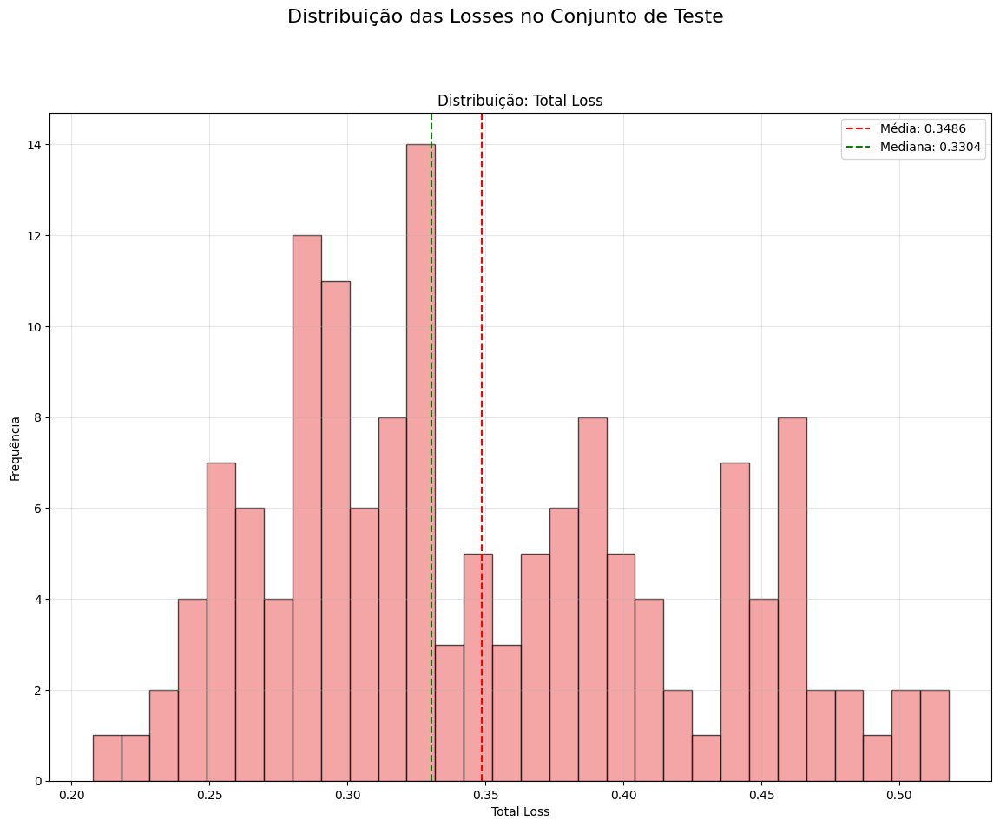

✓ Gráfico salvo: ..\..\figs\posenet\fold1\keypoint_analysis.png


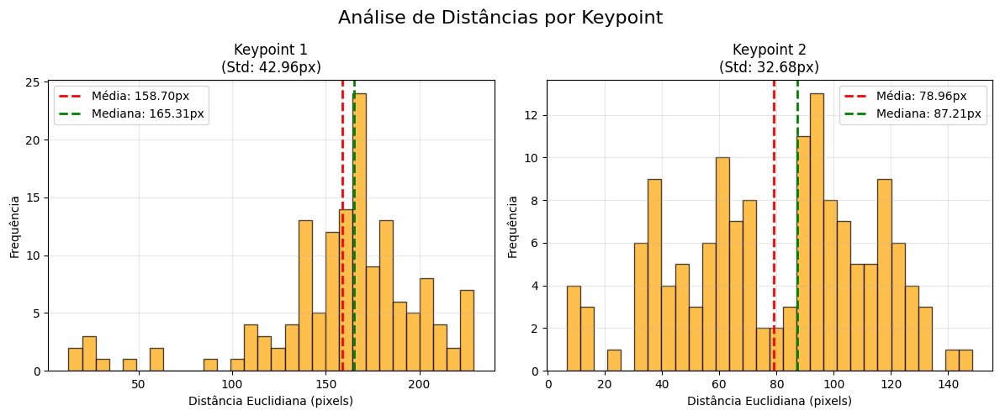


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\posenet\fold1\predictions_by_distance_keypoint1.png


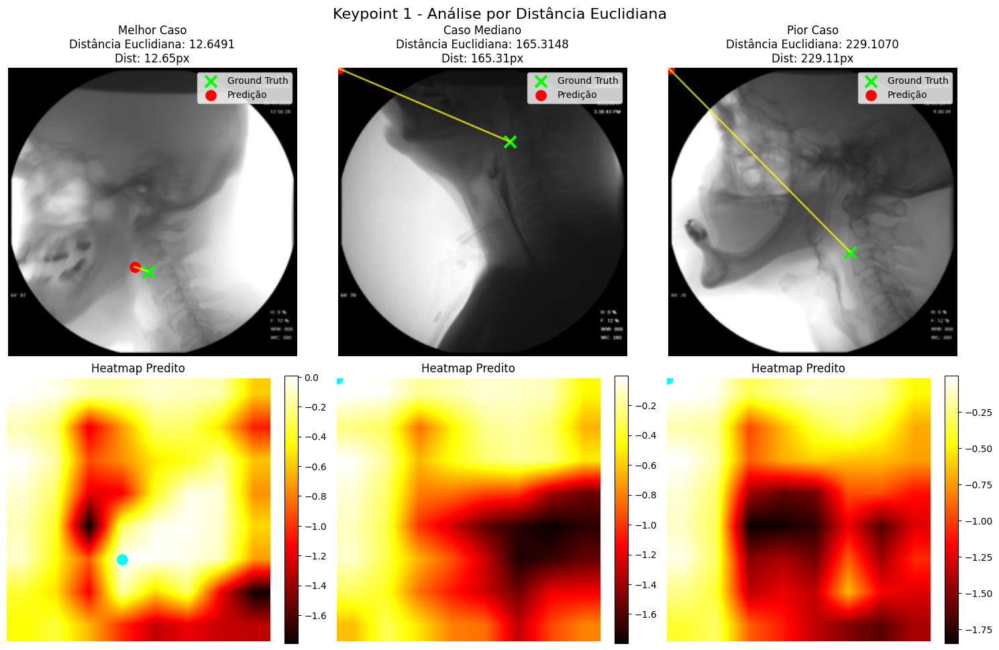


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\posenet\fold1\predictions_by_distance_keypoint2.png


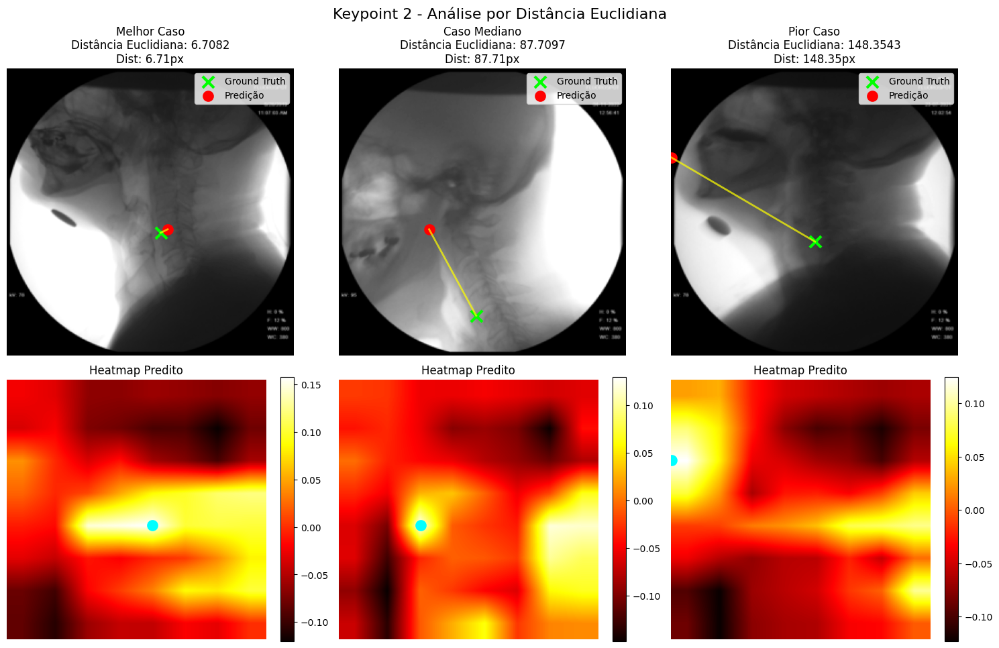


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\posenet\fold1\predictions_by_loss_keypoint1.png


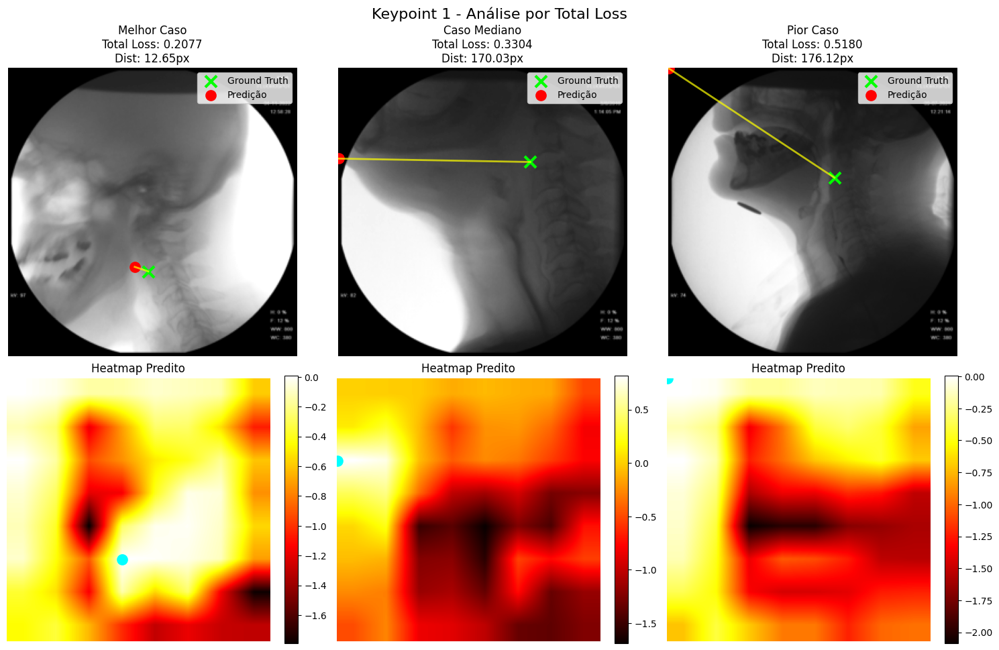


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\posenet\fold1\predictions_by_loss_keypoint2.png


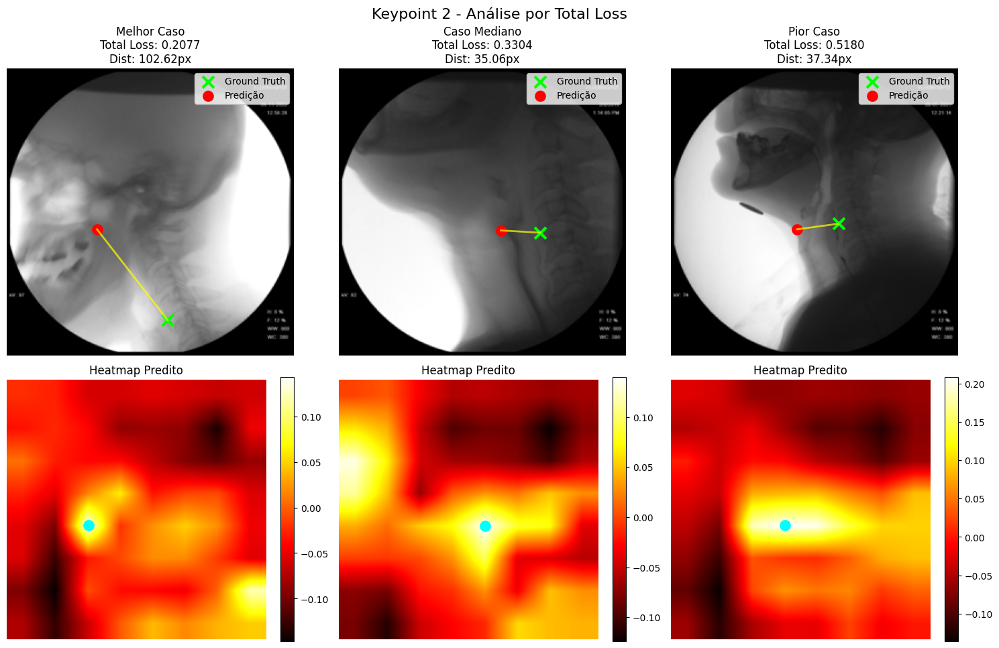

RELATÓRIO DE AVALIAÇÃO NO CONJUNTO DE TESTE

Número de amostras: 146

----------------------------------------------------------------------
LOSS TOTAL
----------------------------------------------------------------------
Média:    0.348607
Mediana:  0.330405
Std:      0.073995
Min:      0.207686
Max:      0.517996

----------------------------------------------------------------------
KEYPOINT 1 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    158.70
Mediana:  165.31
Std:      42.96
Min:      12.65
Max:      229.11
Quartis:  Q1=142.18, Q3=180.34

----------------------------------------------------------------------
KEYPOINT 2 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    78.96
Mediana:  87.21
Std:      32.68
Min:      6.71
Max:      148.35
Quartis:  Q1=56.45, Q3=103.95


✓ Relatório salvo: ..\..\figs\posenet\fold1\evaluation_report.txt

AVALIAÇÃO CONCLUÍ

Avaliando: 100%|██████████| 146/146 [00:22<00:00,  6.45it/s]



GERANDO VISUALIZAÇÕES
✓ Gráfico salvo: ..\..\figs\posenet\fold2\loss_distributions.png


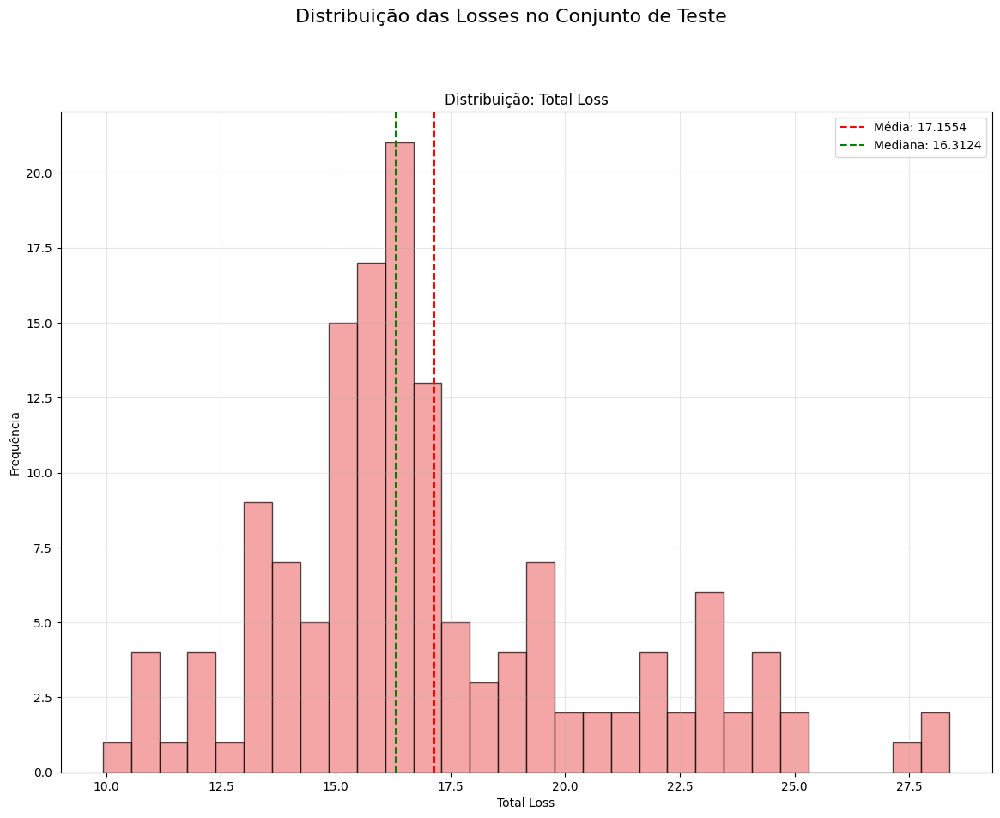

✓ Gráfico salvo: ..\..\figs\posenet\fold2\keypoint_analysis.png


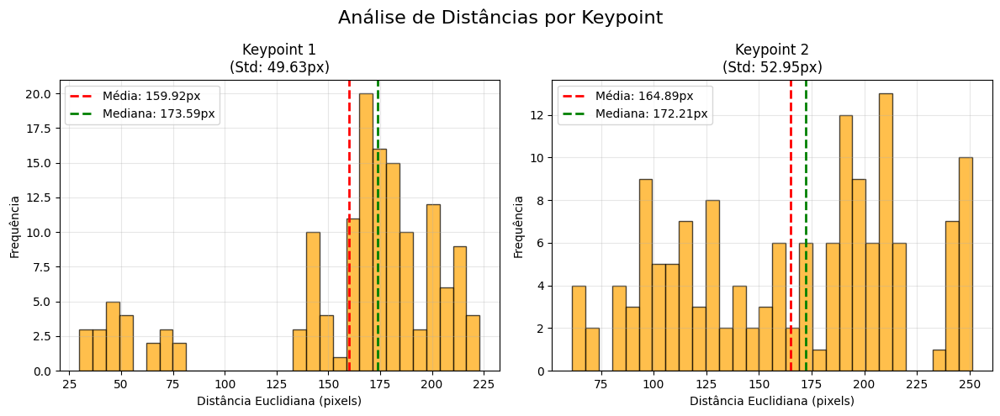


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\posenet\fold2\predictions_by_distance_keypoint1.png


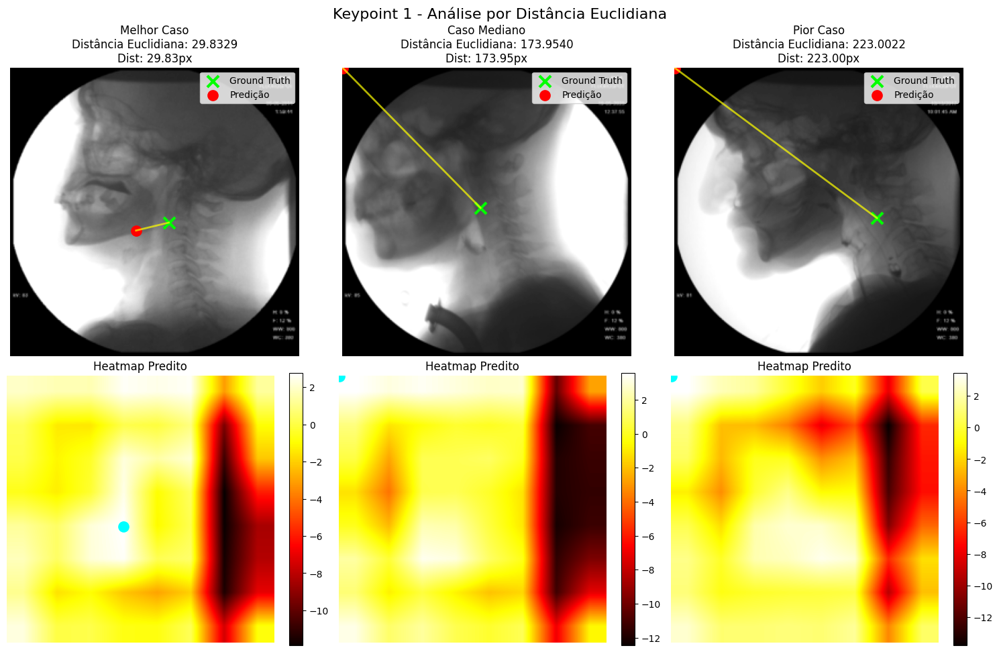


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\posenet\fold2\predictions_by_distance_keypoint2.png


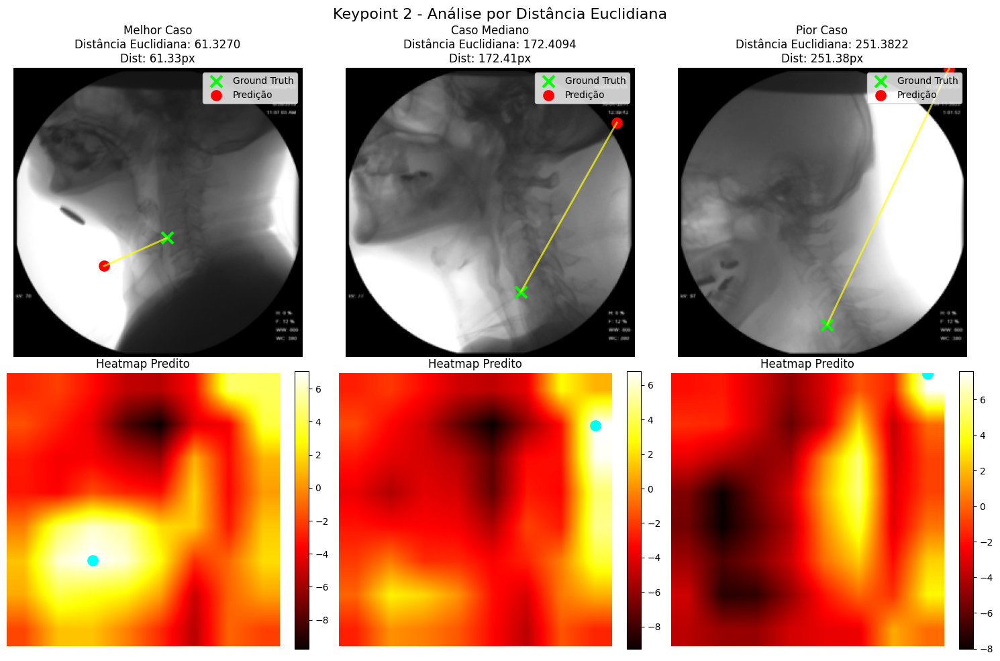


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\posenet\fold2\predictions_by_loss_keypoint1.png


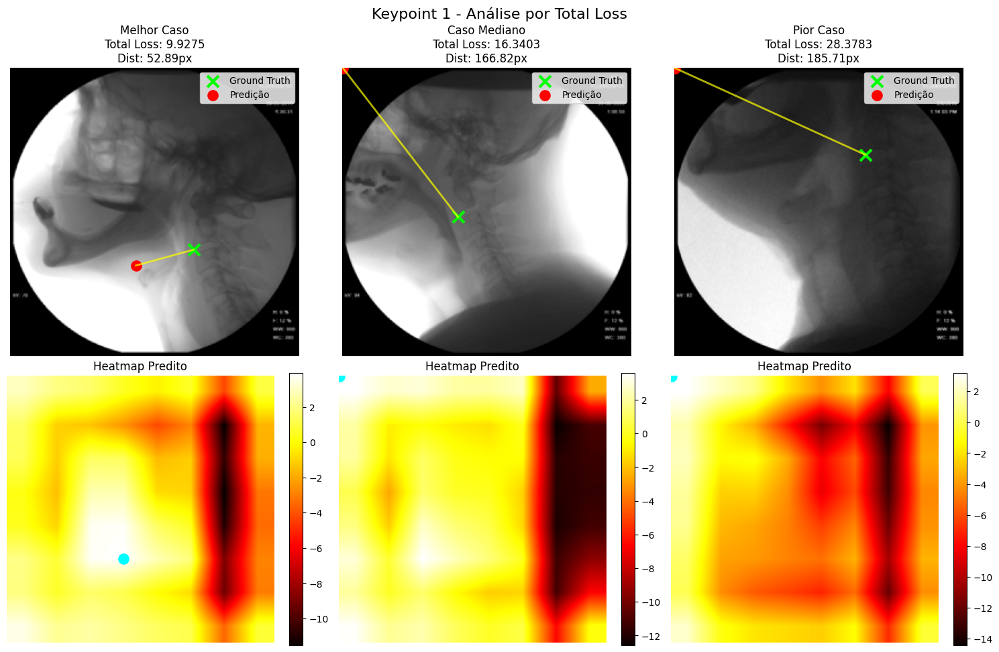


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\posenet\fold2\predictions_by_loss_keypoint2.png


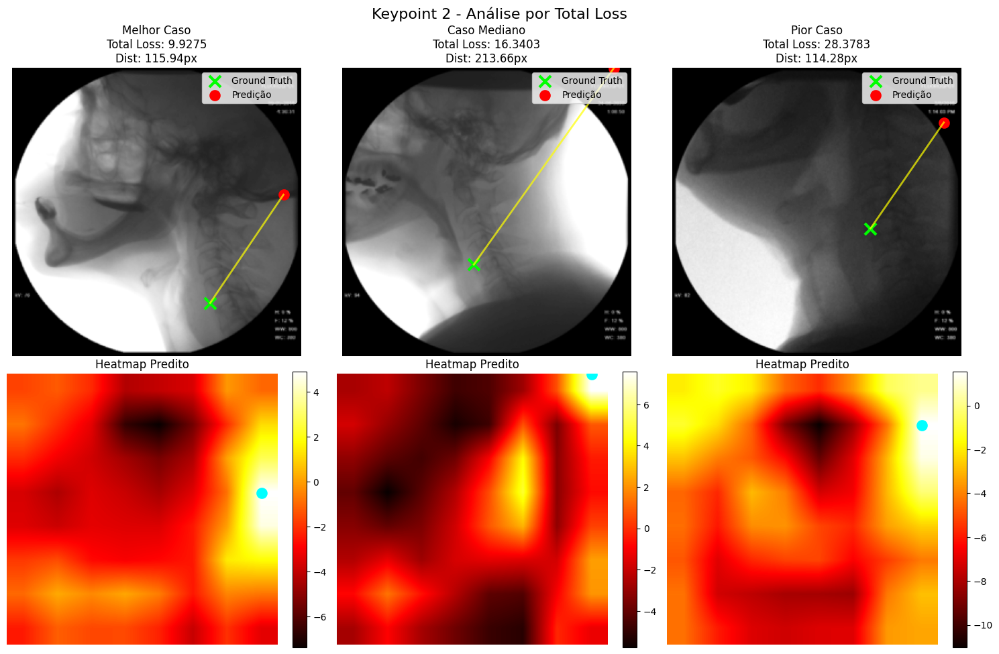

RELATÓRIO DE AVALIAÇÃO NO CONJUNTO DE TESTE

Número de amostras: 146

----------------------------------------------------------------------
LOSS TOTAL
----------------------------------------------------------------------
Média:    17.155351
Mediana:  16.312373
Std:      3.664348
Min:      9.927538
Max:      28.378342

----------------------------------------------------------------------
KEYPOINT 1 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    159.92
Mediana:  173.59
Std:      49.63
Min:      29.83
Max:      223.00
Quartis:  Q1=147.20, Q3=188.65

----------------------------------------------------------------------
KEYPOINT 2 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    164.89
Mediana:  172.21
Std:      52.95
Min:      61.33
Max:      251.38
Quartis:  Q1=116.21, Q3=206.99


✓ Relatório salvo: ..\..\figs\posenet\fold2\evaluation_report.txt

AVALIAÇÃO 

Avaliando: 100%|██████████| 146/146 [00:22<00:00,  6.51it/s]



GERANDO VISUALIZAÇÕES
✓ Gráfico salvo: ..\..\figs\posenet\fold3\loss_distributions.png


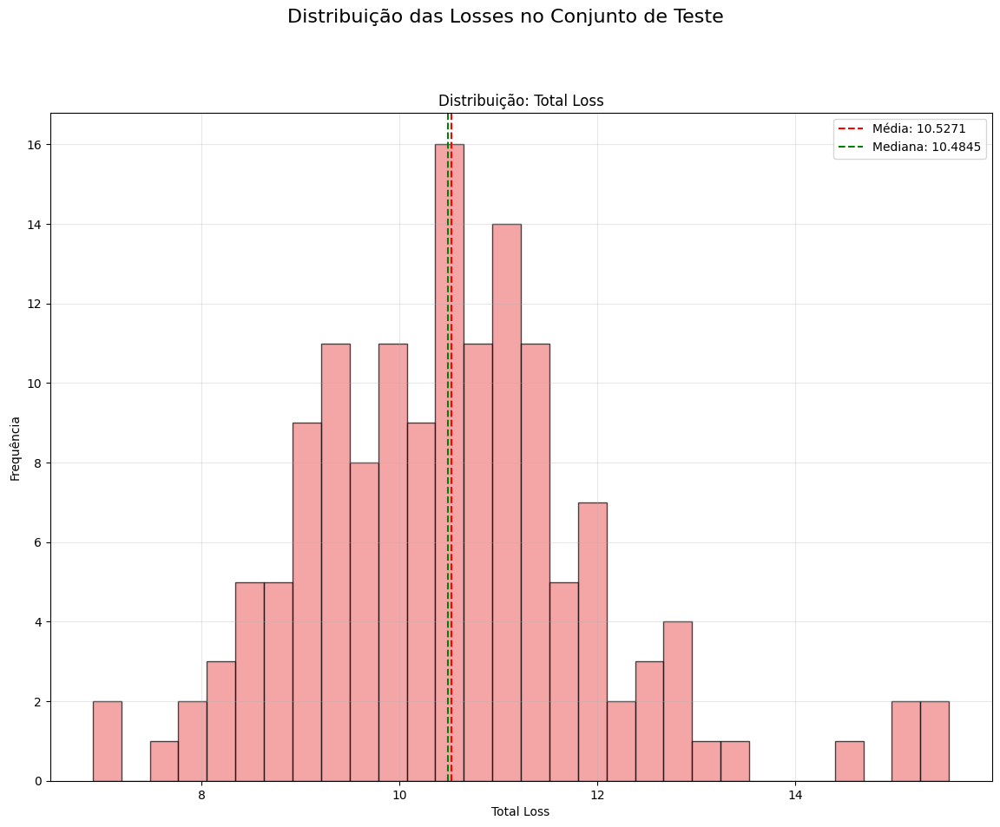

✓ Gráfico salvo: ..\..\figs\posenet\fold3\keypoint_analysis.png


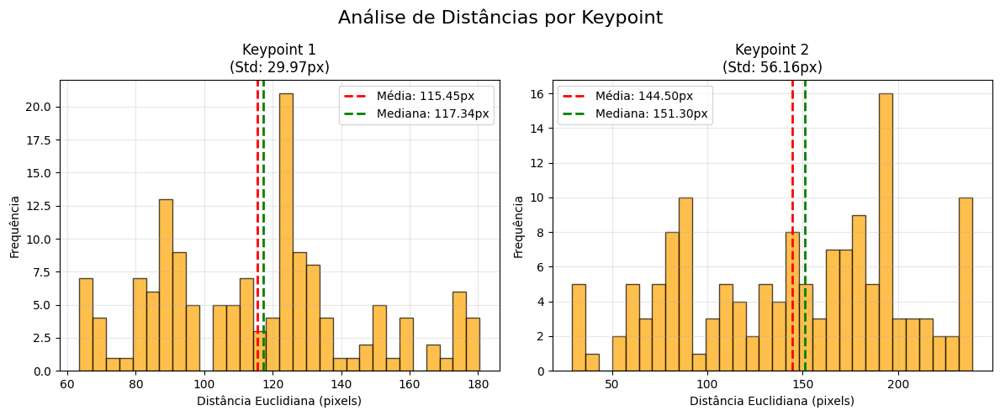


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\posenet\fold3\predictions_by_distance_keypoint1.png


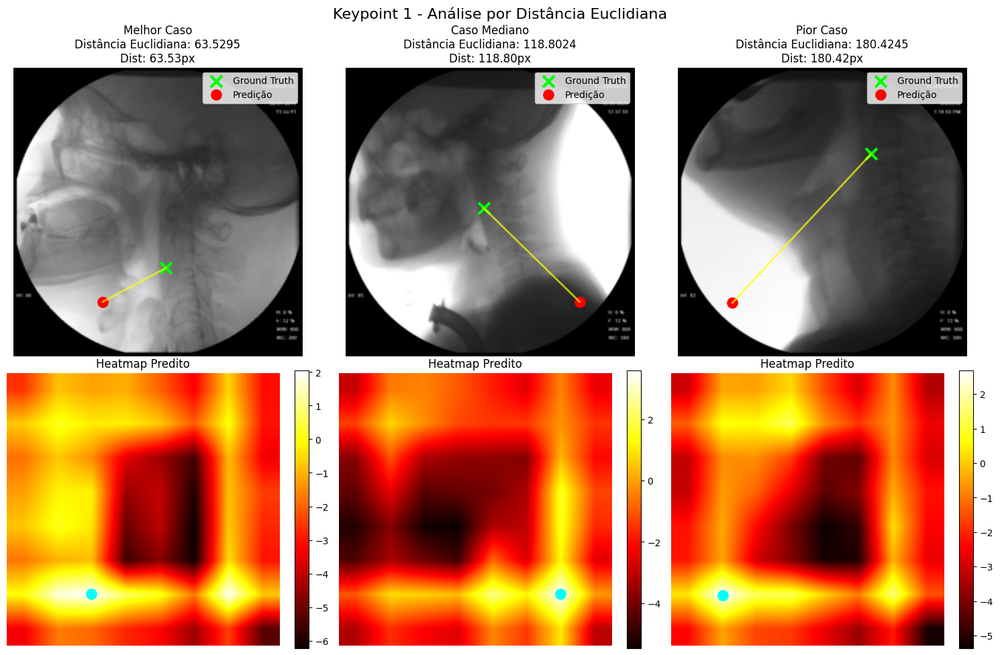


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\posenet\fold3\predictions_by_distance_keypoint2.png


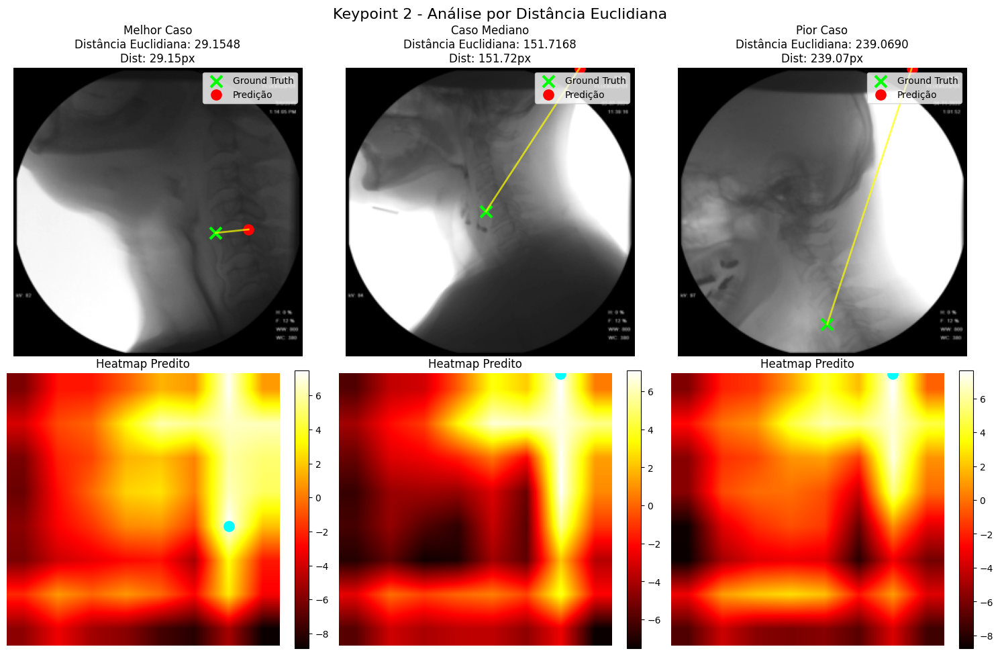


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\posenet\fold3\predictions_by_loss_keypoint1.png


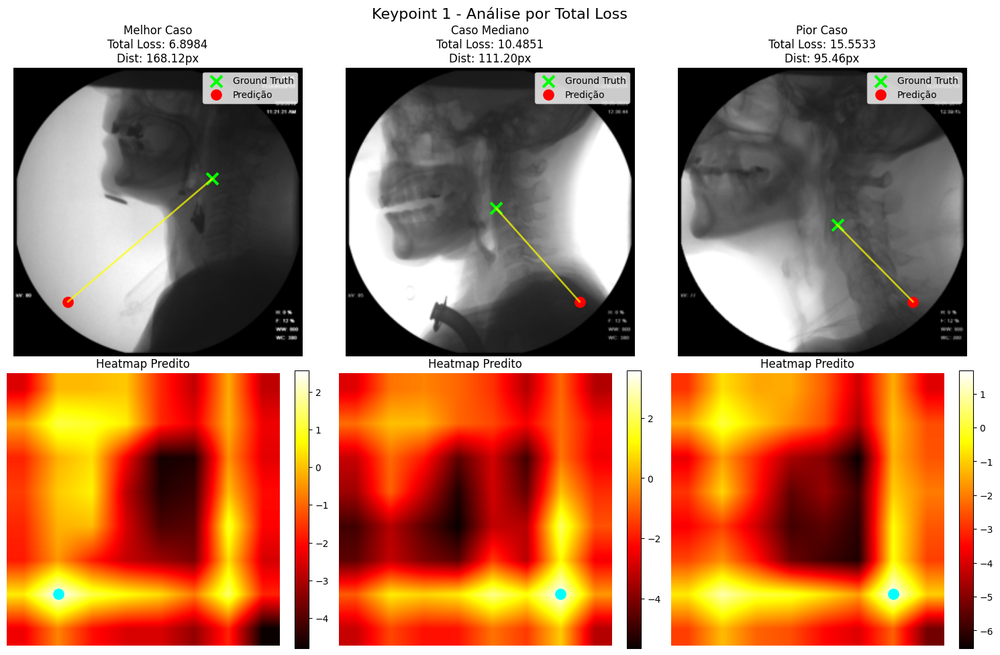


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\posenet\fold3\predictions_by_loss_keypoint2.png


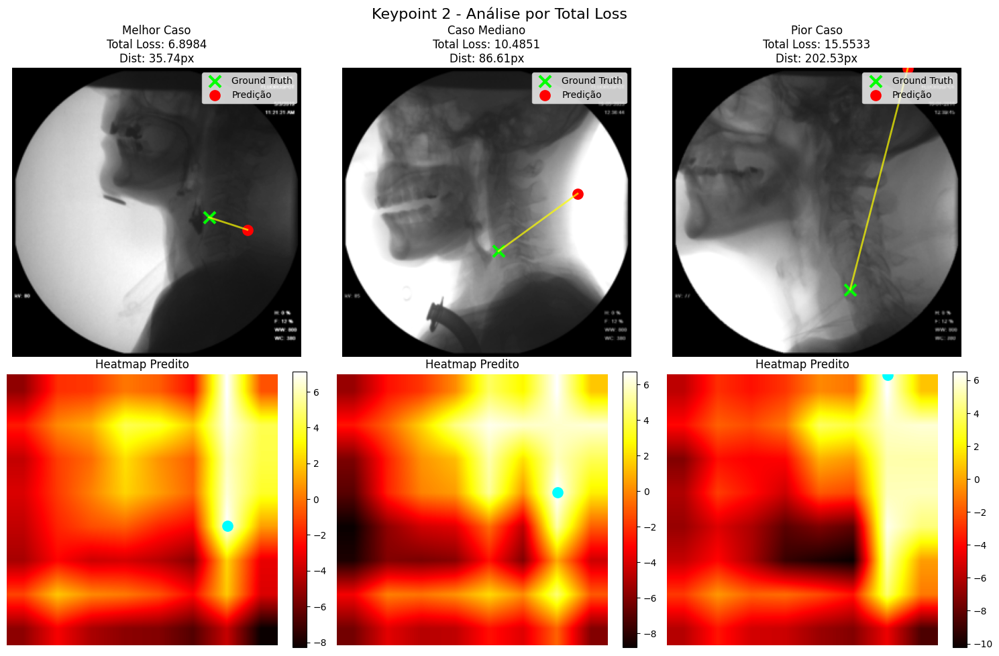

RELATÓRIO DE AVALIAÇÃO NO CONJUNTO DE TESTE

Número de amostras: 146

----------------------------------------------------------------------
LOSS TOTAL
----------------------------------------------------------------------
Média:    10.527051
Mediana:  10.484526
Std:      1.525417
Min:      6.898396
Max:      15.553276

----------------------------------------------------------------------
KEYPOINT 1 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    115.45
Mediana:  117.34
Std:      29.97
Min:      63.53
Max:      180.42
Quartis:  Q1=89.54, Q3=130.13

----------------------------------------------------------------------
KEYPOINT 2 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    144.50
Mediana:  151.30
Std:      56.16
Min:      29.15
Max:      239.07
Quartis:  Q1=91.06, Q3=191.90


✓ Relatório salvo: ..\..\figs\posenet\fold3\evaluation_report.txt

AVALIAÇÃO CO

Avaliando: 100%|██████████| 146/146 [00:21<00:00,  6.76it/s]



GERANDO VISUALIZAÇÕES
✓ Gráfico salvo: ..\..\figs\posenet\fold4\loss_distributions.png


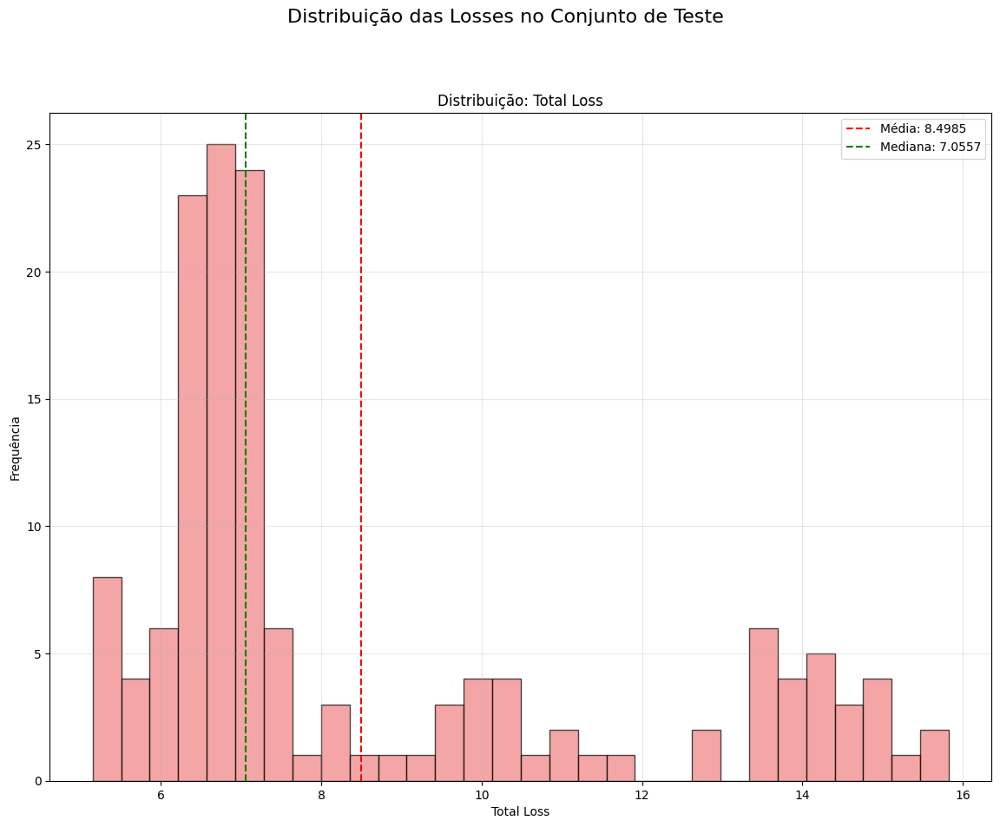

✓ Gráfico salvo: ..\..\figs\posenet\fold4\keypoint_analysis.png


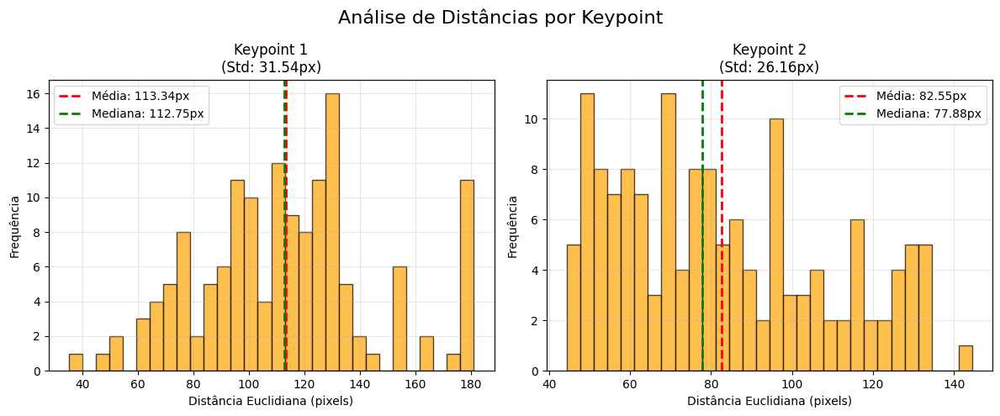


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\posenet\fold4\predictions_by_distance_keypoint1.png


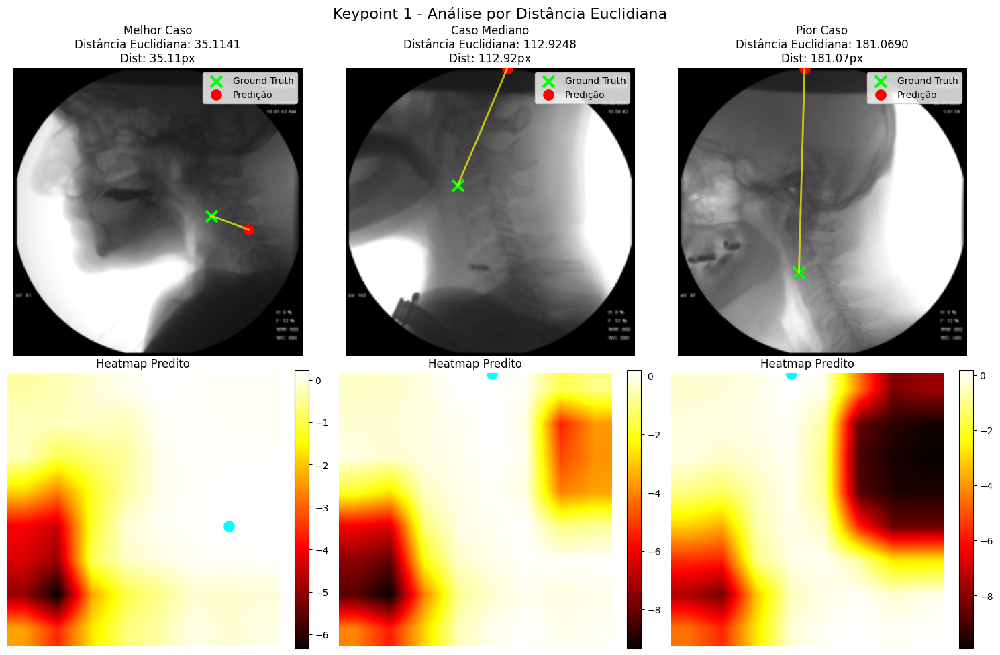


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\posenet\fold4\predictions_by_distance_keypoint2.png


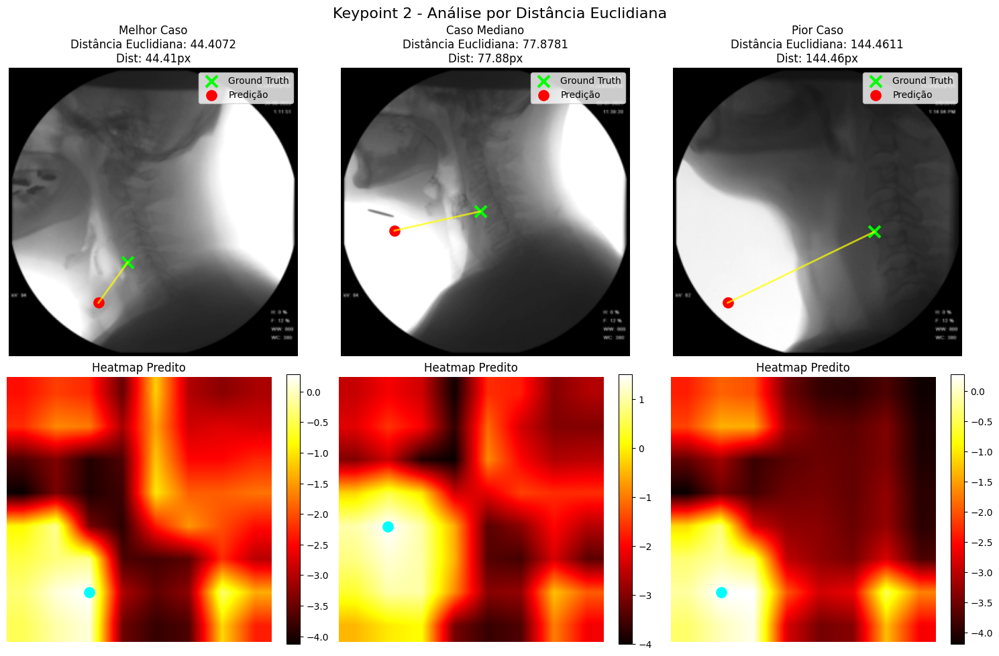


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\posenet\fold4\predictions_by_loss_keypoint1.png


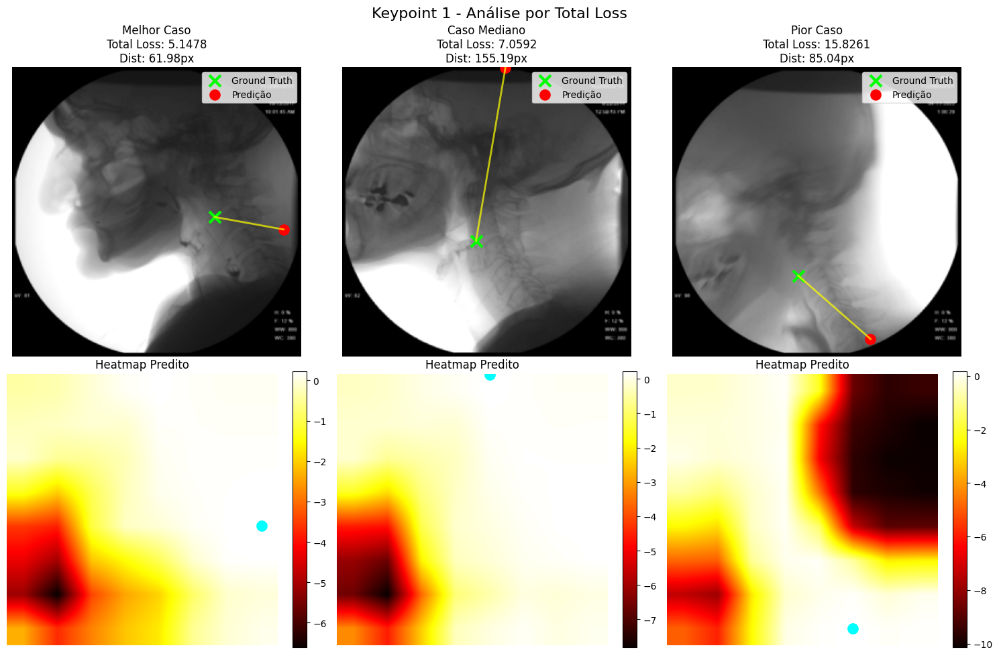


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\posenet\fold4\predictions_by_loss_keypoint2.png


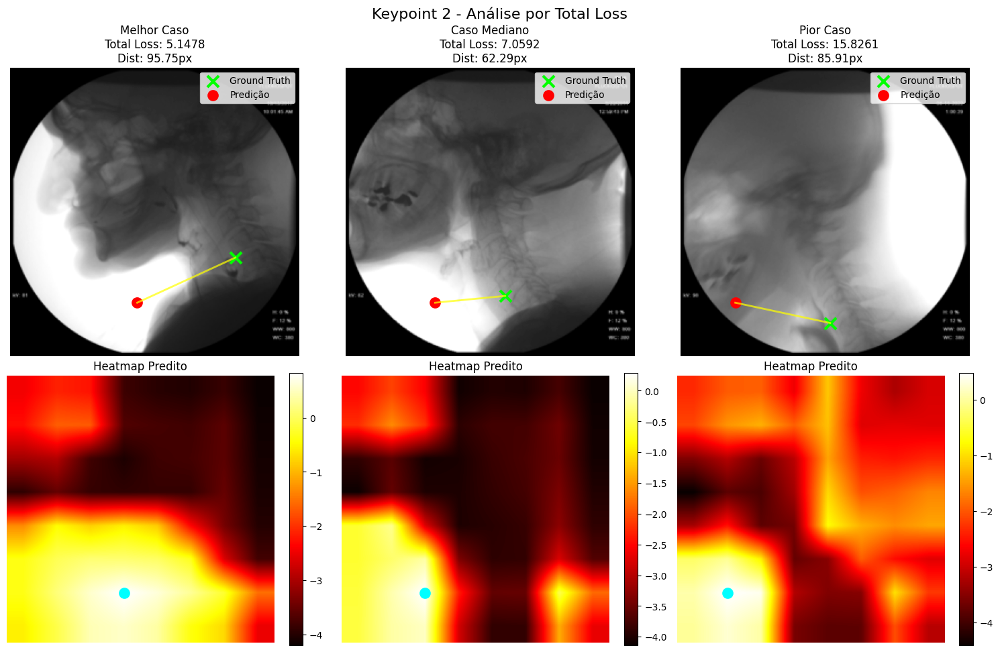

RELATÓRIO DE AVALIAÇÃO NO CONJUNTO DE TESTE

Número de amostras: 146

----------------------------------------------------------------------
LOSS TOTAL
----------------------------------------------------------------------
Média:    8.498457
Mediana:  7.055727
Std:      3.032962
Min:      5.147785
Max:      15.826069

----------------------------------------------------------------------
KEYPOINT 1 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    113.34
Mediana:  112.75
Std:      31.54
Min:      35.11
Max:      181.07
Quartis:  Q1=93.26, Q3=131.45

----------------------------------------------------------------------
KEYPOINT 2 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    82.55
Mediana:  77.88
Std:      26.16
Min:      44.41
Max:      144.46
Quartis:  Q1=60.23, Q3=100.85


✓ Relatório salvo: ..\..\figs\posenet\fold4\evaluation_report.txt

AVALIAÇÃO CONCLU

Avaliando: 100%|██████████| 146/146 [00:21<00:00,  6.91it/s]



GERANDO VISUALIZAÇÕES
✓ Gráfico salvo: ..\..\figs\posenet\fold5\loss_distributions.png


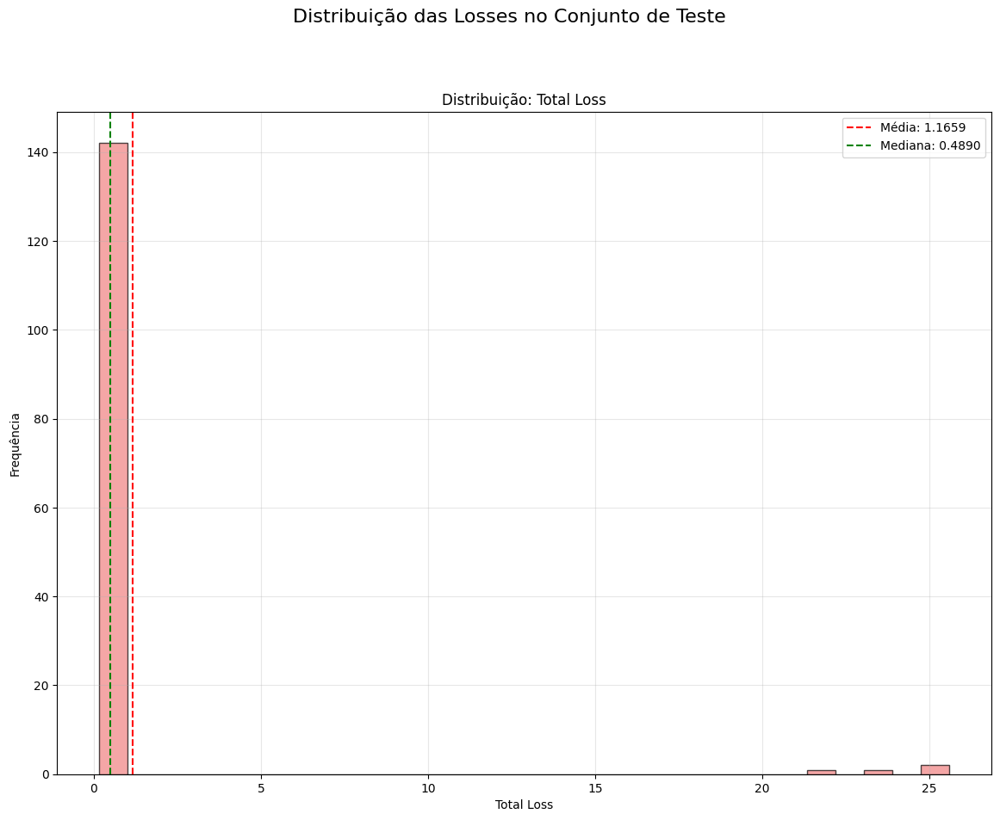

✓ Gráfico salvo: ..\..\figs\posenet\fold5\keypoint_analysis.png


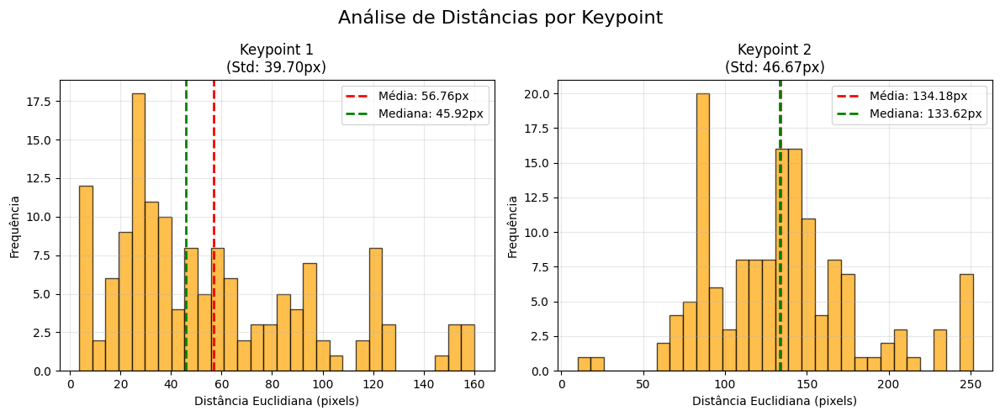


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\posenet\fold5\predictions_by_distance_keypoint1.png


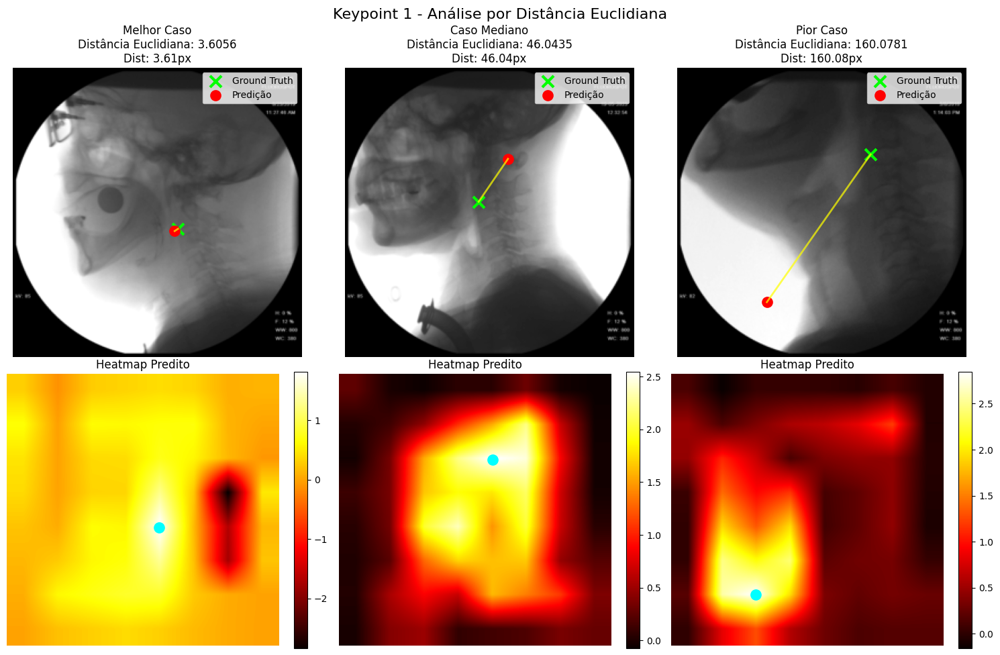


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\posenet\fold5\predictions_by_distance_keypoint2.png


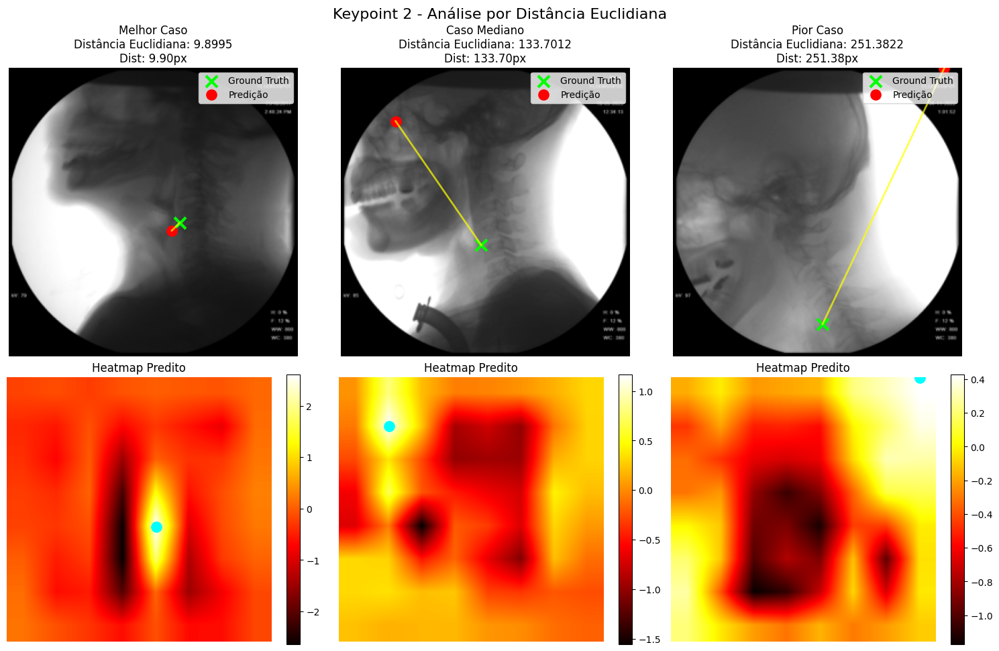


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\posenet\fold5\predictions_by_loss_keypoint1.png


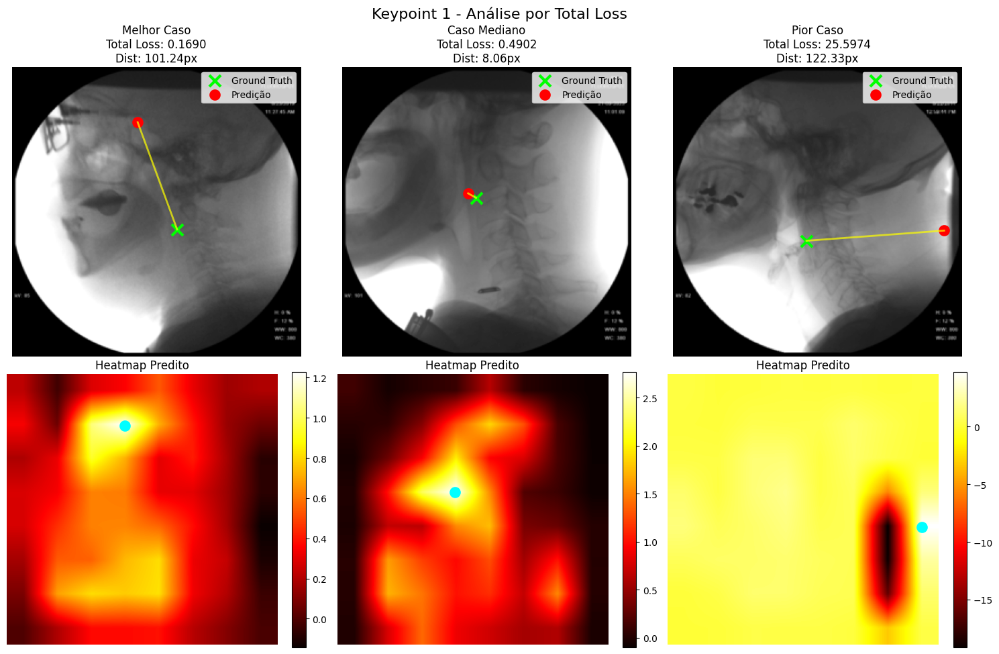


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\posenet\fold5\predictions_by_loss_keypoint2.png


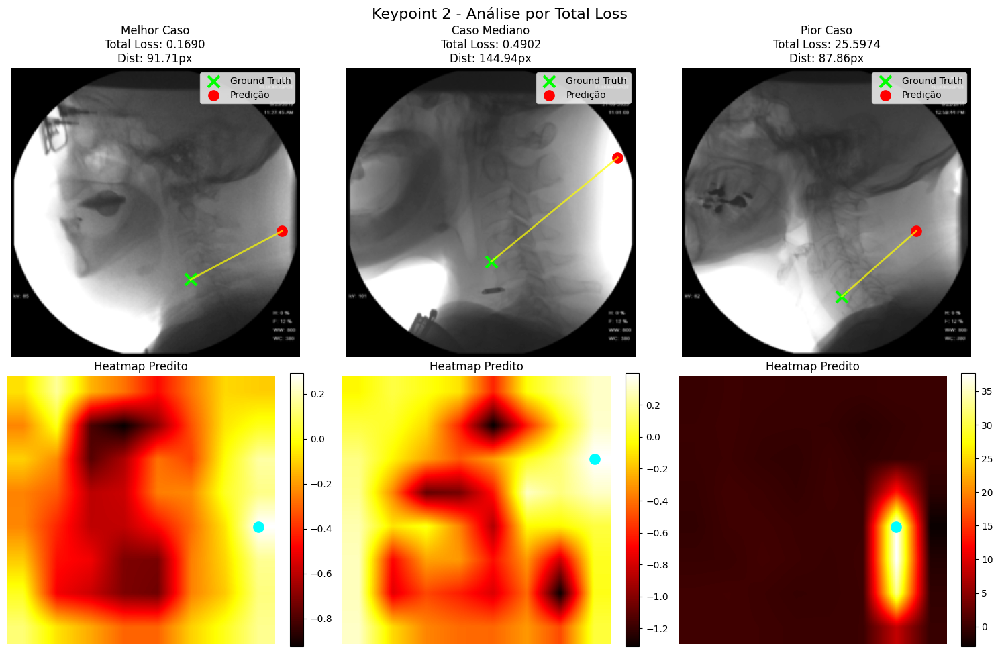

RELATÓRIO DE AVALIAÇÃO NO CONJUNTO DE TESTE

Número de amostras: 146

----------------------------------------------------------------------
LOSS TOTAL
----------------------------------------------------------------------
Média:    1.165923
Mediana:  0.488972
Std:      3.842057
Min:      0.168975
Max:      25.597366

----------------------------------------------------------------------
KEYPOINT 1 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    56.76
Mediana:  45.92
Std:      39.70
Min:      3.61
Max:      160.08
Quartis:  Q1=26.95, Q3=83.81

----------------------------------------------------------------------
KEYPOINT 2 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    134.18
Mediana:  133.62
Std:      46.67
Min:      9.90
Max:      251.38
Quartis:  Q1=97.02, Q3=154.58


✓ Relatório salvo: ..\..\figs\posenet\fold5\evaluation_report.txt

AVALIAÇÃO CONCLUÍDA

In [26]:
# APLICAÇÃO - TESTE
# ============================================================================

for fold_idx in range(len(list_df_folds)):

    # Carrega melhor modelo de cada fold
    checkpoint_path = f"..\\..\\data\\model_weights\\posenet\\fold_{fold_idx+1}_best.pth"
    
    # Cria dataset de teste
    test_dataset = VFSSImageDataset(
        video_frame_df=df_test,
        target="heatmap+roi+points",
        output_dim=(256, 256),
        sigma = 20
    )
    
    model_kwargs = {
        "num_keypoints": 2,
    }

    # Executa avaliação completa
    results = evaluate_model_on_test(
        model_class=PoseNet,
        model_kwargs=model_kwargs,
        checkpoint_path=checkpoint_path,
        test_dataset=test_dataset,
        config=config,
        modify_input_fn=modify_input,
        output_dir=f"..\\..\\figs\\posenet\\fold{fold_idx+1}"
    )
    